In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px
import patsy
import warnings
from datetime import datetime
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default='notebook'
%pylab inline
%config InlineBackend.figure_formats = ['retina']
sns.set_style("darkgrid", {"font.family": ["Times New Roman"]})
sns.set_context("talk") 

Populating the interactive namespace from numpy and matplotlib


C:\Users\Huawei\anaconda3\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning:

pylab import has clobbered these variables: ['datetime']
`%matplotlib` prevents importing * from pylab and numpy



In [2]:
df=pd.read_csv("villaRiyad3.csv")
df

,Unnamed: 0,Estate,Area,Roams,Price,Baths,city,Type
0,0,فيلا للبيع في شارع البغموري ، حي عليشة ، الريا...,355 م²,3,"1,900,000 ريال",3,riyad,villa
1,1,فيلا للبيع في شارع رقم 357 ، حي الملقا ، الريا...,500 م²,5,"4,700,000 ريال",5,riyad,villa
2,2,فيلا للبيع في شارع الهفوف ، حي الصحافة ، الريا...,500 م²,2,"3,300,000 ريال",4,riyad,villa
3,3,فيلا للبيع في شارع جعفر بن احمد ، حي الدار الب...,230 م²,5,"880,000 ريال",5,riyad,villa
4,4,فيلا للبيع في حي عكاظ ، الرياض ، الرياض,325 م²,5,"1,100,000 ريال",5,riyad,villa
...,...,...,...,...,...,...,...,...
39573,39573,فيلا للبيع في شارع وادي نوار ، حي الملقا ، الر...,875 م²,5,"8,000,000 ريال",5,riyad,villa
39574,39574,فيلا للبيع في طريق العزيزية ، حي الدار البيضاء...,280 م²,4,"1,100,000 ريال",5,riyad,villa
39575,39575,فيلا للبيع في شارع محمد بن حمد بن حامد ، حي اش...,243 م²,5,"1,700,000 ريال",5,riyad,villa
39576,39576,فيلا للبيع في شارع بحر العرب ، حي اشبيلية ، ال...,324 م²,4,"1,950,000 ريال",4,riyad,villa


In [3]:
 #searching for douplicate values

df[df.duplicated()]


,Unnamed: 0,Estate,Area,Roams,Price,Baths,city,Type


In [4]:
to_drop = ['Unnamed: 0']
df.drop(to_drop, inplace=True, axis=1)
df.head()

,Estate,Area,Roams,Price,Baths,city,Type
0,فيلا للبيع في شارع البغموري ، حي عليشة ، الريا...,355 م²,3,"1,900,000 ريال",3,riyad,villa
1,فيلا للبيع في شارع رقم 357 ، حي الملقا ، الريا...,500 م²,5,"4,700,000 ريال",5,riyad,villa
2,فيلا للبيع في شارع الهفوف ، حي الصحافة ، الريا...,500 م²,2,"3,300,000 ريال",4,riyad,villa
3,فيلا للبيع في شارع جعفر بن احمد ، حي الدار الب...,230 م²,5,"880,000 ريال",5,riyad,villa
4,فيلا للبيع في حي عكاظ ، الرياض ، الرياض,325 م²,5,"1,100,000 ريال",5,riyad,villa


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39578 entries, 0 to 39577
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Estate  39578 non-null  object
 1   Area    39578 non-null  object
 2   Roams   39578 non-null  int64 
 3   Price   39578 non-null  object
 4   Baths   39578 non-null  int64 
 5   city    39578 non-null  object
 6   Type    39578 non-null  object
dtypes: int64(2), object(5)
memory usage: 2.1+ MB


In [6]:
df=df[df["Estate"].str.contains("الرياض")==True]
df

,Estate,Area,Roams,Price,Baths,city,Type
0,فيلا للبيع في شارع البغموري ، حي عليشة ، الريا...,355 م²,3,"1,900,000 ريال",3,riyad,villa
1,فيلا للبيع في شارع رقم 357 ، حي الملقا ، الريا...,500 م²,5,"4,700,000 ريال",5,riyad,villa
2,فيلا للبيع في شارع الهفوف ، حي الصحافة ، الريا...,500 م²,2,"3,300,000 ريال",4,riyad,villa
3,فيلا للبيع في شارع جعفر بن احمد ، حي الدار الب...,230 م²,5,"880,000 ريال",5,riyad,villa
4,فيلا للبيع في حي عكاظ ، الرياض ، الرياض,325 م²,5,"1,100,000 ريال",5,riyad,villa
...,...,...,...,...,...,...,...
39573,فيلا للبيع في شارع وادي نوار ، حي الملقا ، الر...,875 م²,5,"8,000,000 ريال",5,riyad,villa
39574,فيلا للبيع في طريق العزيزية ، حي الدار البيضاء...,280 م²,4,"1,100,000 ريال",5,riyad,villa
39575,فيلا للبيع في شارع محمد بن حمد بن حامد ، حي اش...,243 م²,5,"1,700,000 ريال",5,riyad,villa
39576,فيلا للبيع في شارع بحر العرب ، حي اشبيلية ، ال...,324 م²,4,"1,950,000 ريال",4,riyad,villa


In [7]:
df['Estate'] = df['Estate'].str.replace("الرياض","")
df['Estate'] = df['Estate'].str.replace("،","")
df['Estate'] = df.Estate.str.strip()
df['Price'] = df['Price'].str.replace("ريال","")
df['Area'] = df['Area'].str.replace("م²","")

def get_neighborhoo(Estate):
    if 'شارع' not in Estate:
          return None
    return str.split(Estate,'شارع')[1]

df['neighborhoo'] = df.Estate.map(get_neighborhoo)


In [8]:
df.dropna(inplace=True)

In [9]:
def get_Neighborhood(neighborhoo):
    if 'حي' not in neighborhoo:
          return None
    return str.split(neighborhoo, 'حي')[1]

df['Neighborhood'] = df.neighborhoo.map(get_Neighborhood)

In [10]:
df.dropna(inplace=True)

In [11]:
df

,Estate,Area,Roams,Price,Baths,city,Type,neighborhoo,Neighborhood
0,فيلا للبيع في شارع البغموري حي عليشة,355,3,"1,900,000",3,riyad,villa,البغموري حي عليشة,عليشة
1,فيلا للبيع في شارع رقم 357 حي الملقا,500,5,"4,700,000",5,riyad,villa,رقم 357 حي الملقا,الملقا
2,فيلا للبيع في شارع الهفوف حي الصحافة,500,2,"3,300,000",4,riyad,villa,الهفوف حي الصحافة,الصحافة
3,فيلا للبيع في شارع جعفر بن احمد حي الدار البيضاء,230,5,"880,000",5,riyad,villa,جعفر بن احمد حي الدار البيضاء,الدار البيضاء
5,فيلا للبيع في شارع رقم 254 حي النرجس,450,5,"3,400,000",5,riyad,villa,رقم 254 حي النرجس,النرجس
...,...,...,...,...,...,...,...,...,...
39572,فيلا للبيع في شارع يونس الوفراوندي حي طويق,300,5,"1,200,000",5,riyad,villa,يونس الوفراوندي حي طويق,طويق
39573,فيلا للبيع في شارع وادي نوار حي الملقا,875,5,"8,000,000",5,riyad,villa,وادي نوار حي الملقا,الملقا
39575,فيلا للبيع في شارع محمد بن حمد بن حامد حي اشب...,243,5,"1,700,000",5,riyad,villa,محمد بن حمد بن حامد حي اشبيلية,اشبيلية
39576,فيلا للبيع في شارع بحر العرب حي اشبيلية,324,4,"1,950,000",4,riyad,villa,بحر العرب حي اشبيلية,اشبيلية


In [12]:
df['Neighborhood']=df.Neighborhood.str.strip()

In [13]:
counts=df.Neighborhood.value_counts()
counts

طويق             6398
الدار البيضاء    2201
الرمال           2148
عليشة            1439
الملقا           1246
                 ... 
ى بن عطوه           1
ان                  1
النرجس,             1
در الحلي            1
ى العلمي            1
Name: Neighborhood, Length: 226, dtype: int64

In [14]:
df = df.loc[df['Neighborhood'].isin(counts.index[counts > 100])]
df

,Estate,Area,Roams,Price,Baths,city,Type,neighborhoo,Neighborhood
0,فيلا للبيع في شارع البغموري حي عليشة,355,3,"1,900,000",3,riyad,villa,البغموري حي عليشة,عليشة
1,فيلا للبيع في شارع رقم 357 حي الملقا,500,5,"4,700,000",5,riyad,villa,رقم 357 حي الملقا,الملقا
2,فيلا للبيع في شارع الهفوف حي الصحافة,500,2,"3,300,000",4,riyad,villa,الهفوف حي الصحافة,الصحافة
3,فيلا للبيع في شارع جعفر بن احمد حي الدار البيضاء,230,5,"880,000",5,riyad,villa,جعفر بن احمد حي الدار البيضاء,الدار البيضاء
5,فيلا للبيع في شارع رقم 254 حي النرجس,450,5,"3,400,000",5,riyad,villa,رقم 254 حي النرجس,النرجس
...,...,...,...,...,...,...,...,...,...
39572,فيلا للبيع في شارع يونس الوفراوندي حي طويق,300,5,"1,200,000",5,riyad,villa,يونس الوفراوندي حي طويق,طويق
39573,فيلا للبيع في شارع وادي نوار حي الملقا,875,5,"8,000,000",5,riyad,villa,وادي نوار حي الملقا,الملقا
39575,فيلا للبيع في شارع محمد بن حمد بن حامد حي اشب...,243,5,"1,700,000",5,riyad,villa,محمد بن حمد بن حامد حي اشبيلية,اشبيلية
39576,فيلا للبيع في شارع بحر العرب حي اشبيلية,324,4,"1,950,000",4,riyad,villa,بحر العرب حي اشبيلية,اشبيلية


In [15]:
df.reset_index(drop=True, inplace=True)
df.head()


,Estate,Area,Roams,Price,Baths,city,Type,neighborhoo,Neighborhood
0,فيلا للبيع في شارع البغموري حي عليشة,355,3,"1,900,000",3,riyad,villa,البغموري حي عليشة,عليشة
1,فيلا للبيع في شارع رقم 357 حي الملقا,500,5,"4,700,000",5,riyad,villa,رقم 357 حي الملقا,الملقا
2,فيلا للبيع في شارع الهفوف حي الصحافة,500,2,"3,300,000",4,riyad,villa,الهفوف حي الصحافة,الصحافة
3,فيلا للبيع في شارع جعفر بن احمد حي الدار البيضاء,230,5,"880,000",5,riyad,villa,جعفر بن احمد حي الدار البيضاء,الدار البيضاء
4,فيلا للبيع في شارع رقم 254 حي النرجس,450,5,"3,400,000",5,riyad,villa,رقم 254 حي النرجس,النرجس


In [16]:
df = df[['Price', 'Area','Roams', 'Baths','Neighborhood']]
df

,Price,Area,Roams,Baths,Neighborhood
0,"1,900,000",355,3,3,عليشة
1,"4,700,000",500,5,5,الملقا
2,"3,300,000",500,2,4,الصحافة
3,"880,000",230,5,5,الدار البيضاء
4,"3,400,000",450,5,5,النرجس
...,...,...,...,...,...
25884,"1,200,000",300,5,5,طويق
25885,"8,000,000",875,5,5,الملقا
25886,"1,700,000",243,5,5,اشبيلية
25887,"1,950,000",324,4,4,اشبيلية


In [17]:
df['Neighborhood'].unique()

array(['عليشة', 'الملقا', 'الصحافة', 'الدار البيضاء', 'النرجس', 'طويق',
       'قرطبة', 'العارض', 'المونسية', 'النسيم الغربي', 'ظهرة البديعة',
       'الملك فيصل', 'الحمراء', 'الرمال', 'بدر', 'عكاظ', 'النهضة',
       'الاندلس', 'مطار الملك خالد الدولي', 'الحزم', 'الزهرة',
       'العريجاء الوسطى', 'الشفا', 'ظهرة لبن', 'المهدية', 'القادسية',
       'العزيزية', 'البيان    رماح', 'ظهرة نمار', 'طيبة', 'الخليج',
       'اليرموك', 'السويدي', 'العريجاء الغربية', 'ديراب', 'القيروان',
       'العقيق', 'الجنادرية', 'السعادة', 'حطين', 'اشبيلية'], dtype=object)

In [18]:
df.describe()

,Roams,Baths
count,25889.000000,25889.000000
mean,4.911082,4.602920
std,1.178606,0.766859
min,1.000000,1.000000
25%,4.000000,5.000000
50%,5.000000,5.000000
75%,5.000000,5.000000
max,7.000000,5.000000


In [19]:
df.drop(df[df['Neighborhood']=='الزهرة'].index,inplace=True)

In [20]:
df.Neighborhood.unique()



array(['عليشة', 'الملقا', 'الصحافة', 'الدار البيضاء', 'النرجس', 'طويق',
       'قرطبة', 'العارض', 'المونسية', 'النسيم الغربي', 'ظهرة البديعة',
       'الملك فيصل', 'الحمراء', 'الرمال', 'بدر', 'عكاظ', 'النهضة',
       'الاندلس', 'مطار الملك خالد الدولي', 'الحزم', 'العريجاء الوسطى',
       'الشفا', 'ظهرة لبن', 'المهدية', 'القادسية', 'العزيزية',
       'البيان    رماح', 'ظهرة نمار', 'طيبة', 'الخليج', 'اليرموك',
       'السويدي', 'العريجاء الغربية', 'ديراب', 'القيروان', 'العقيق',
       'الجنادرية', 'السعادة', 'حطين', 'اشبيلية'], dtype=object)

In [21]:
#df.drop_duplicates(subset=None, keep='first', inplace=True)

In [22]:
df['Price'] = df.Price.str.replace(",",'')

In [23]:
df['Area'] = df['Area'].astype('float') 
df['Price'] = df['Price'].astype('float') 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25755 entries, 0 to 25888
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Price         25755 non-null  float64
 1   Area          25755 non-null  float64
 2   Roams         25755 non-null  int64  
 3   Baths         25755 non-null  int64  
 4   Neighborhood  25755 non-null  object 
dtypes: float64(2), int64(2), object(1)
memory usage: 1.2+ MB


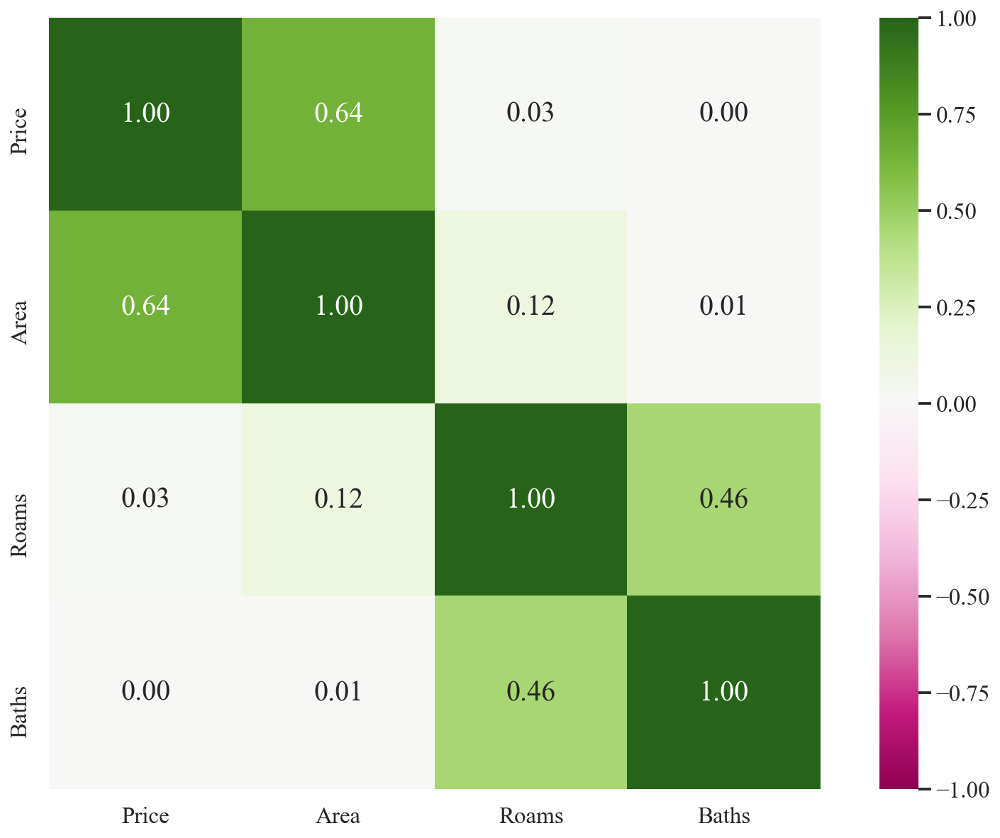

In [24]:
plt.figure(figsize=(15,10))
correlation = df.corr()
sns.heatmap(correlation, vmax=1,vmin=-1, cmap= 'PiYG', cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 20});

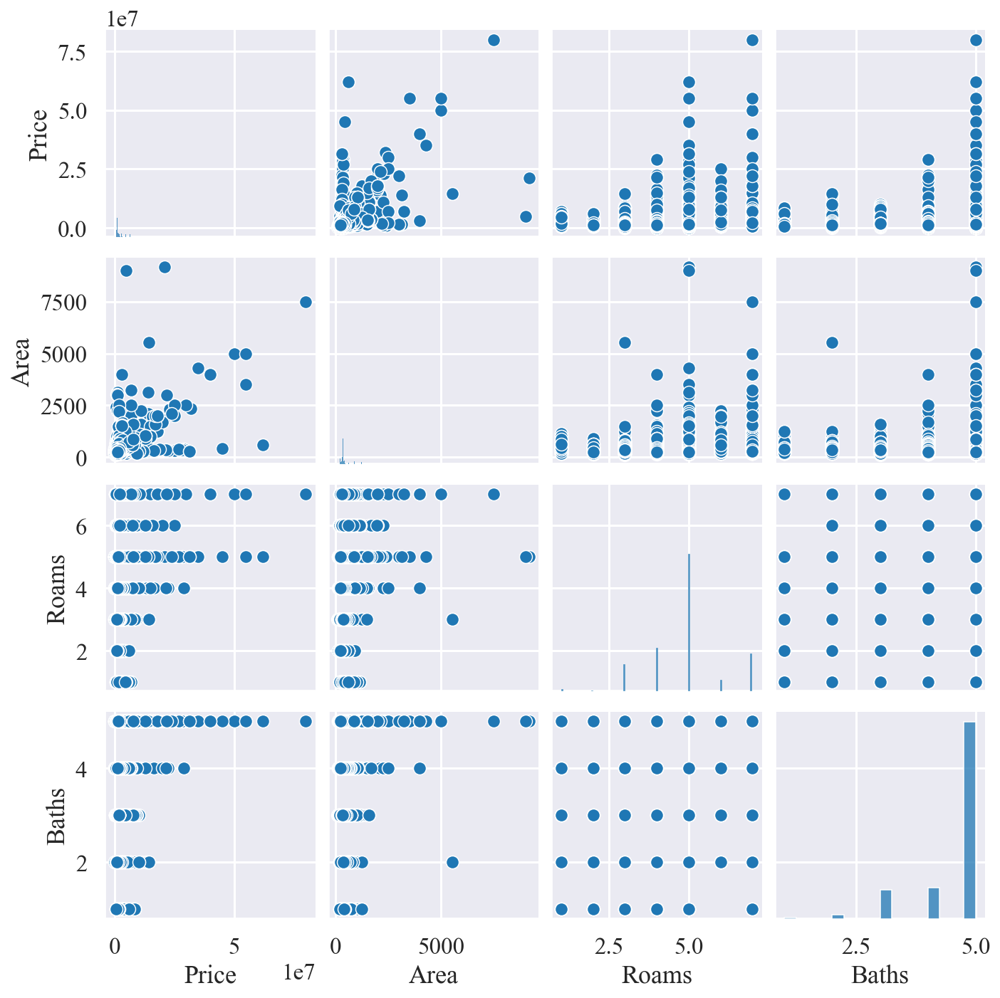

In [25]:
sns.pairplot(df)

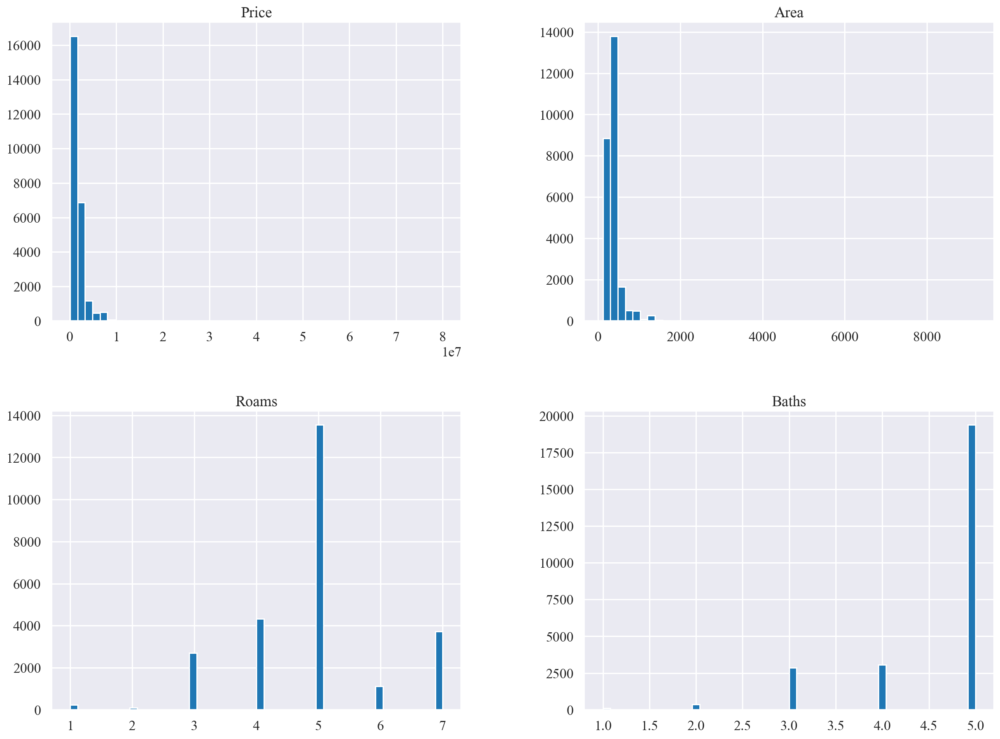

In [26]:
df.hist(bins=50, figsize=(20,15));

C:\Users\Huawei\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



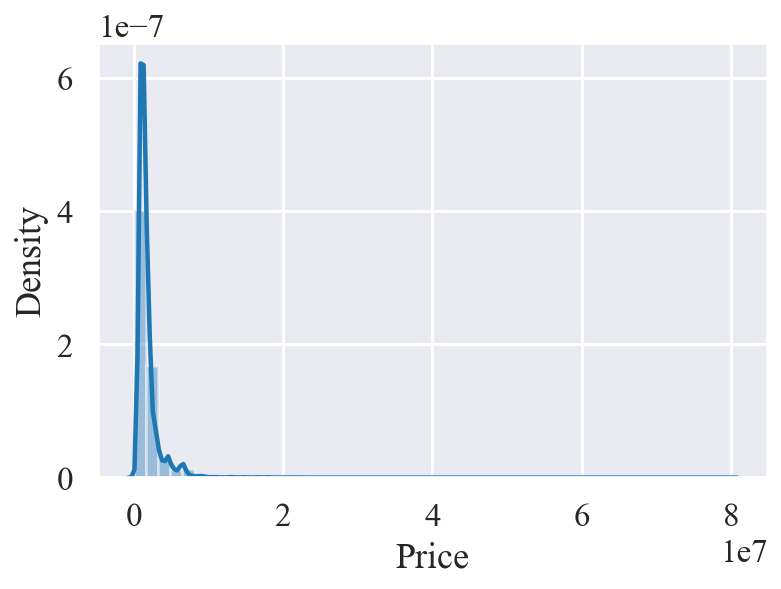

In [27]:
sns.distplot(df['Price'])
plt.show()


C:\Users\Huawei\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



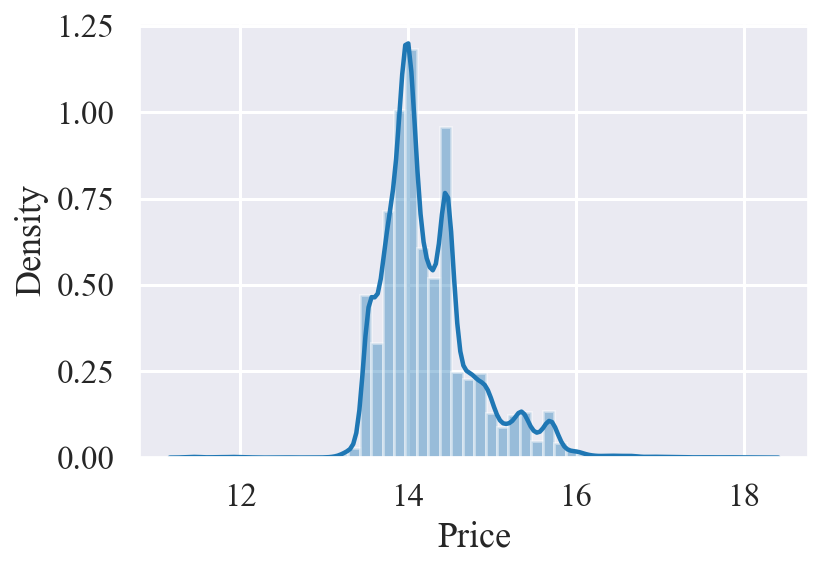

In [28]:
df['Price'] = np.log(df["Price"])
#check distribution after log transform.
sns.distplot(df['Price'])
plt.show()

C:\Users\Huawei\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



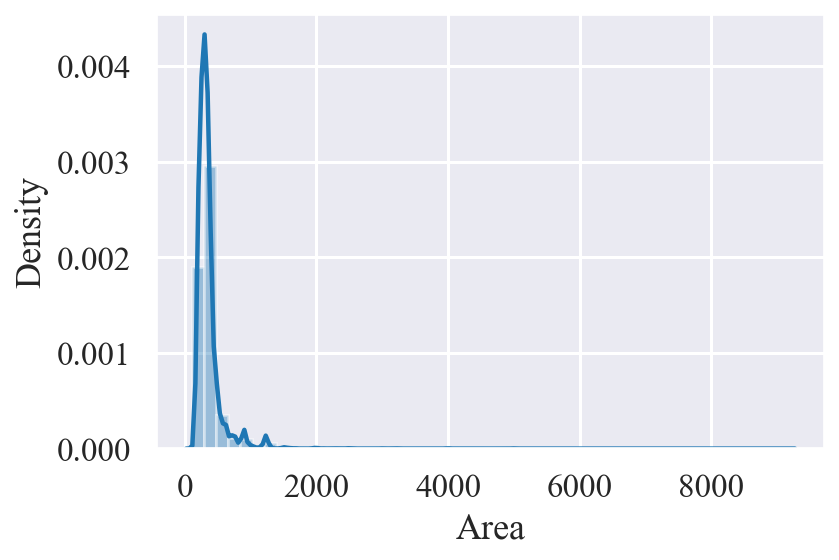

In [29]:
sns.distplot(df['Area'])
plt.show()

C:\Users\Huawei\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



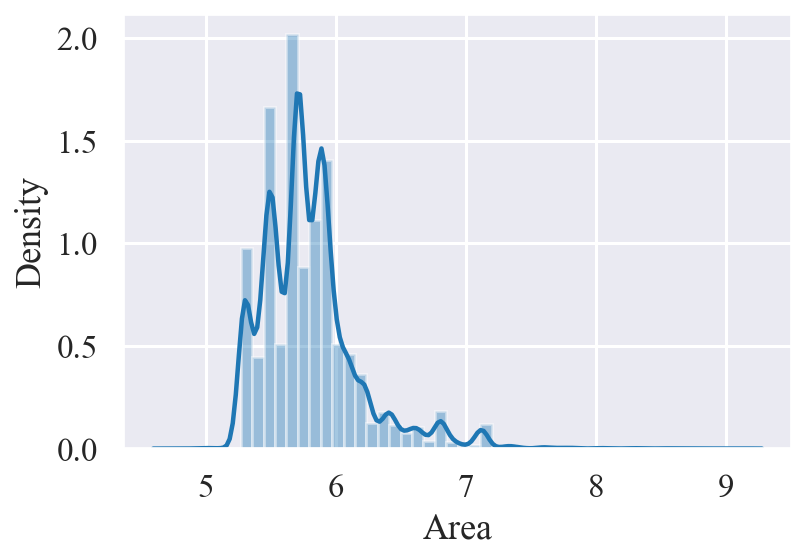

In [30]:
df['Area'] = np.log(df["Area"])
#check distribution after log transform.
sns.distplot(df['Area'])
plt.show()

In [31]:
data = [
    go.Box(y=df.Price, name='Price'),
    go.Box(y=df.Area, name='Area'),
    go.Box(y=df.Roams, name='Roams'),
    go.Box(y=df.Baths, name='Baths')
]
fig = go.Figure(data=data)
fig.show()

In [32]:
df.Price[df.Price < 12.5] = None
df.Price[df.Price > 15.7] = None
#df.Area[df.Area < 7.4] = None
df.Area[df.Area > 8] = None
df.Roams[df.Roams <4] = None

df.Baths[df.Baths <3] = None


In [33]:
df = df.dropna()

In [34]:
df

,Price,Area,Roams,Baths,Neighborhood
1,15.363073,6.214608,5.0,5.0,الملقا
3,13.687677,5.438079,5.0,5.0,الدار البيضاء
4,15.039286,6.109248,5.0,5.0,النرجس
5,13.764217,5.393628,7.0,5.0,طويق
6,15.123843,6.059123,6.0,5.0,قرطبة
...,...,...,...,...,...
25883,13.795308,5.480639,5.0,5.0,الحزم
25884,13.997832,5.703782,5.0,5.0,طويق
25886,14.346139,5.493061,5.0,5.0,اشبيلية
25887,14.483340,5.780744,4.0,4.0,اشبيلية


In [35]:
df_dummy=pd.get_dummies(df)
df_dummy.columns

Index(['Price', 'Area', 'Roams', 'Baths', 'Neighborhood_اشبيلية',
       'Neighborhood_الاندلس', 'Neighborhood_البيان    رماح',
       'Neighborhood_الجنادرية', 'Neighborhood_الحزم', 'Neighborhood_الحمراء',
       'Neighborhood_الخليج', 'Neighborhood_الدار البيضاء',
       'Neighborhood_الرمال', 'Neighborhood_السعادة', 'Neighborhood_السويدي',
       'Neighborhood_الشفا', 'Neighborhood_الصحافة', 'Neighborhood_العارض',
       'Neighborhood_العريجاء الغربية', 'Neighborhood_العريجاء الوسطى',
       'Neighborhood_العزيزية', 'Neighborhood_العقيق', 'Neighborhood_القادسية',
       'Neighborhood_القيروان', 'Neighborhood_الملقا',
       'Neighborhood_الملك فيصل', 'Neighborhood_المهدية',
       'Neighborhood_المونسية', 'Neighborhood_النرجس',
       'Neighborhood_النسيم الغربي', 'Neighborhood_النهضة',
       'Neighborhood_اليرموك', 'Neighborhood_بدر', 'Neighborhood_حطين',
       'Neighborhood_ديراب', 'Neighborhood_طويق', 'Neighborhood_طيبة',
       'Neighborhood_ظهرة البديعة', 'Neighborhood_ظهرة ل

In [36]:
import hvplot.pandas

In [37]:
df_dummy.hvplot.scatter(x='Area', y='Price')

:Scatter   [Area]   (Price)

In [38]:
df_dummy.describe()

,Price,Area,Roams,Baths,Neighborhood_اشبيلية,Neighborhood_الاندلس,Neighborhood_البيان رماح,Neighborhood_الجنادرية,Neighborhood_الحزم,Neighborhood_الحمراء,...,Neighborhood_ديراب,Neighborhood_طويق,Neighborhood_طيبة,Neighborhood_ظهرة البديعة,Neighborhood_ظهرة لبن,Neighborhood_ظهرة نمار,Neighborhood_عكاظ,Neighborhood_عليشة,Neighborhood_قرطبة,Neighborhood_مطار الملك خالد الدولي
count,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,...,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000,21935.000000
mean,14.191005,5.774801,5.190289,4.787281,0.010896,0.004331,0.005699,0.008206,0.029998,0.014361,...,0.004513,0.267518,0.029633,0.005699,0.017917,0.017871,0.049829,0.000456,0.012172,0.012491
std,0.499261,0.364148,0.928013,0.510644,0.103815,0.065669,0.075276,0.090217,0.170585,0.118975,...,0.067031,0.442675,0.169577,0.075276,0.132651,0.132486,0.217597,0.021347,0.109657,0.111067
min,12.873902,4.941642,4.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13.864301,5.521461,5.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,14.038654,5.703782,5.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,14.457364,5.926926,5.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15.687313,7.824046,7.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [39]:
df_dummy.columns

Index(['Price', 'Area', 'Roams', 'Baths', 'Neighborhood_اشبيلية',
       'Neighborhood_الاندلس', 'Neighborhood_البيان    رماح',
       'Neighborhood_الجنادرية', 'Neighborhood_الحزم', 'Neighborhood_الحمراء',
       'Neighborhood_الخليج', 'Neighborhood_الدار البيضاء',
       'Neighborhood_الرمال', 'Neighborhood_السعادة', 'Neighborhood_السويدي',
       'Neighborhood_الشفا', 'Neighborhood_الصحافة', 'Neighborhood_العارض',
       'Neighborhood_العريجاء الغربية', 'Neighborhood_العريجاء الوسطى',
       'Neighborhood_العزيزية', 'Neighborhood_العقيق', 'Neighborhood_القادسية',
       'Neighborhood_القيروان', 'Neighborhood_الملقا',
       'Neighborhood_الملك فيصل', 'Neighborhood_المهدية',
       'Neighborhood_المونسية', 'Neighborhood_النرجس',
       'Neighborhood_النسيم الغربي', 'Neighborhood_النهضة',
       'Neighborhood_اليرموك', 'Neighborhood_بدر', 'Neighborhood_حطين',
       'Neighborhood_ديراب', 'Neighborhood_طويق', 'Neighborhood_طيبة',
       'Neighborhood_ظهرة البديعة', 'Neighborhood_ظهرة ل

In [40]:

X = df_dummy[['Area', 'Roams', 'Baths', 'Neighborhood_اشبيلية',
       'Neighborhood_الاندلس', 'Neighborhood_البيان    رماح',
       'Neighborhood_الجنادرية', 'Neighborhood_الحزم', 'Neighborhood_الحمراء',
       'Neighborhood_الخليج', 'Neighborhood_الدار البيضاء',
       'Neighborhood_الرمال', 'Neighborhood_السعادة', 'Neighborhood_السويدي',
       'Neighborhood_الشفا', 'Neighborhood_الصحافة', 'Neighborhood_العارض',
       'Neighborhood_العريجاء الغربية', 'Neighborhood_العريجاء الوسطى',
       'Neighborhood_العزيزية', 'Neighborhood_العقيق', 'Neighborhood_القادسية',
       'Neighborhood_القيروان', 'Neighborhood_الملقا',
       'Neighborhood_الملك فيصل', 'Neighborhood_المهدية',
       'Neighborhood_المونسية', 'Neighborhood_النرجس',
       'Neighborhood_النسيم الغربي', 'Neighborhood_النهضة',
       'Neighborhood_اليرموك', 'Neighborhood_بدر', 'Neighborhood_حطين',
       'Neighborhood_ديراب', 'Neighborhood_طويق', 'Neighborhood_طيبة',
       'Neighborhood_ظهرة البديعة', 'Neighborhood_ظهرة لبن',
       'Neighborhood_ظهرة نمار', 'Neighborhood_عكاظ', 'Neighborhood_عليشة',
       'Neighborhood_قرطبة', 'Neighborhood_مطار الملك خالد الدولي']]
y = df_dummy['Price']

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
#Train Test Split
#Now let's split the data into a training set and a testing set. We will train out model on the training set and then use the test set to evaluate the model.

from sklearn import metrics
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=5)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

In [43]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('std_scalar', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [44]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)

LinearRegression(normalize=True)

In [45]:
# print the intercept
print(lin_reg.intercept_)

14.189883912642246


In [46]:
coeff_df = pd.DataFrame(lin_reg.coef_, X.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Area,2.160815e-01
Roams,-1.013372e-02
Baths,1.749262e-02
Neighborhood_اشبيلية,1.346993e+09
Neighborhood_الاندلس,8.449795e+08
Neighborhood_البيان رماح,1.014080e+09
Neighborhood_الجنادرية,1.188353e+09
Neighborhood_الحزم,2.308890e+09
Neighborhood_الحمراء,1.607289e+09
Neighborhood_الخليج,1.171264e+09


In [47]:
pred = lin_reg.predict(X_test)

In [48]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)

In [49]:
pd.DataFrame({'Error Values': (y_test - pred)}).hvplot.kde()

:Distribution   [Error Values]   (Density)

In [50]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.09867468291265136
MSE: 0.020148991549983404
RMSE: 0.1419471435076571
R2 Square 0.9182239022715522
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.10000827637636396
MSE: 0.02080165580313929
RMSE: 0.1442277913688596
R2 Square 0.9167796597191011
__________________________________


In [51]:
results_df = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.098675,0.020149,0.141947,0.918224,0.912458


In [52]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=50, solver='cholesky', tol=0.0001, random_state=42)
model.fit(X_train, y_train)
pred = model.predict(X_test)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.09872510622099363
MSE: 0.02015182378510932
RMSE: 0.14195711952948792
R2 Square 0.9182124074463212
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.10005525645532838
MSE: 0.0208027714611331
RMSE: 0.14423165901123478
R2 Square 0.9167751963514366
__________________________________


In [53]:
results_df_2 = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.098675,0.020149,0.141947,0.918224,0.912458
1,Ridge Regression,0.098725,0.020152,0.141957,0.918212,0.912469


In [54]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=20, 
              precompute=True, 
#               warm_start=True, 
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.3879179422515272
MSE: 0.24642366229832943
RMSE: 0.49641077979666137
R2 Square -0.00012774538717863493
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.3900857128438445
MSE: 0.2499587929216121
RMSE: 0.49995879122344883
R2 Square 0.0
__________________________________


In [55]:
results_df_2 = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.098675,0.020149,0.141947,0.918224,0.912458
1,Ridge Regression,0.098725,0.020152,0.141957,0.918212,0.912469
2,Lasso Regression,0.387918,0.246424,0.496411,-0.000128,-0.023750


In [56]:
from sklearn.preprocessing import PolynomialFeatures

poly_reg = PolynomialFeatures(degree=2)

X_train_2_d = poly_reg.fit_transform(X_train)
X_test_2_d = poly_reg.transform(X_test)

lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train_2_d,y_train)

test_pred = lin_reg.predict(X_test_2_d)
train_pred = lin_reg.predict(X_train_2_d)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.10212437698083607
MSE: 0.02118897888367249
RMSE: 0.14556434619669917
R2 Square 0.9140030406157649
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.101670199947431
MSE: 0.020351306638029185
RMSE: 0.14265800586728103
R2 Square 0.9185813533496643
__________________________________


In [57]:
cross_val(model) 


-0.023749599698190772

In [58]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)

In [59]:
results_df_2 = pd.DataFrame(data=[["Polynomail Regression", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.098675,0.020149,0.141947,0.918224,0.912458
1,Ridge Regression,0.098725,0.020152,0.141957,0.918212,0.912469
2,Lasso Regression,0.387918,0.246424,0.496411,-0.000128,-0.023750
3,Polynomail Regression,0.102124,0.021189,0.145564,0.914003,0.000000


In [60]:
from sklearn.linear_model import ElasticNet

model = ElasticNet(alpha=0.1, l1_ratio=0.9, selection='random', random_state=42)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.245294173651919
MSE: 0.09705612570332514
RMSE: 0.31153832140416554
R2 Square 0.6060908953695912
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.24529943903353538
MSE: 0.09777329141090407
RMSE: 0.3126872101812034
R2 Square 0.6088423605023325
__________________________________


In [61]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)

In [62]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.245294173651919
MSE: 0.09705612570332514
RMSE: 0.31153832140416554
R2 Square 0.6060908953695912
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.24529943903353538
MSE: 0.09777329141090407
RMSE: 0.3126872101812034
R2 Square 0.6088423605023325
__________________________________


In [63]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=100)
rf_reg.fit(X_train, y_train)

test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.0614974497557385
MSE: 0.011372133510358377
RMSE: 0.10664020588107646
R2 Square 0.9538453972241212
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.04509542636730348
MSE: 0.005826106915727703
RMSE: 0.07632893891393816
R2 Square 0.9766917304743314
__________________________________


In [64]:
pred = rf_reg.predict(X_test)

In [65]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)

In [66]:
pd.DataFrame({'Error Values': (y_test - pred)}).hvplot.kde()

:Distribution   [Error Values]   (Density)

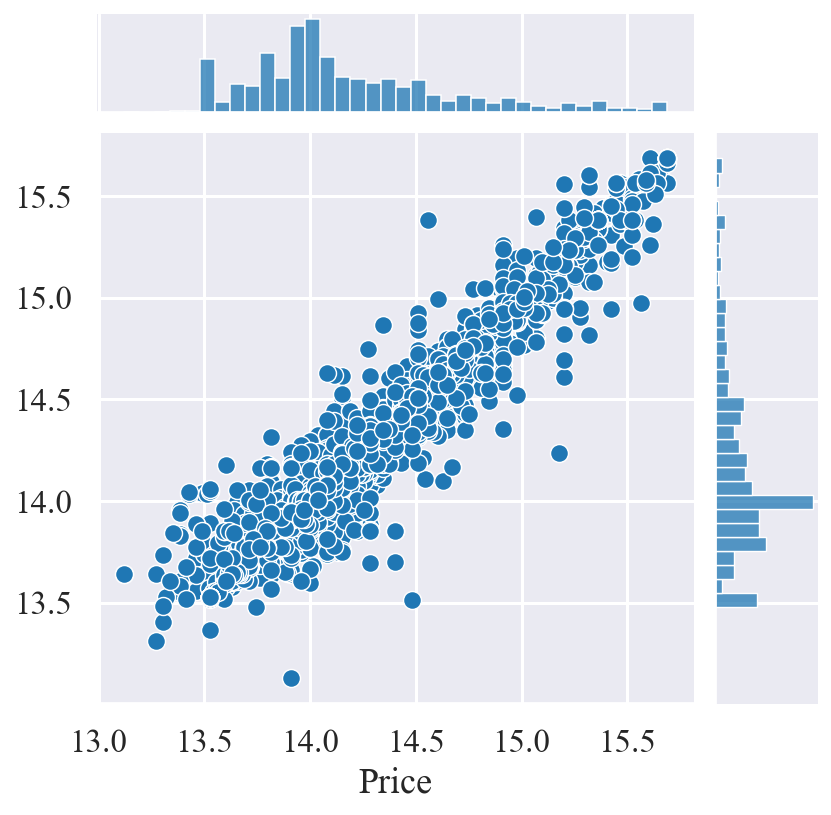

In [67]:
sns.jointplot(x=y_test,y=pred)

In [68]:
results_df_2 = pd.DataFrame(data=[["Random Forest", *evaluate(y_test, test_pred), cross_val(RandomForestRegressor())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.098675,0.020149,0.141947,0.918224,0.912458
1,Ridge Regression,0.098725,0.020152,0.141957,0.918212,0.912469
2,Lasso Regression,0.387918,0.246424,0.496411,-0.000128,-0.023750
3,Polynomail Regression,0.102124,0.021189,0.145564,0.914003,0.000000
4,Random Forest,0.061497,0.011372,0.106640,0.953845,0.952807


<AxesSubplot:ylabel='Model'>

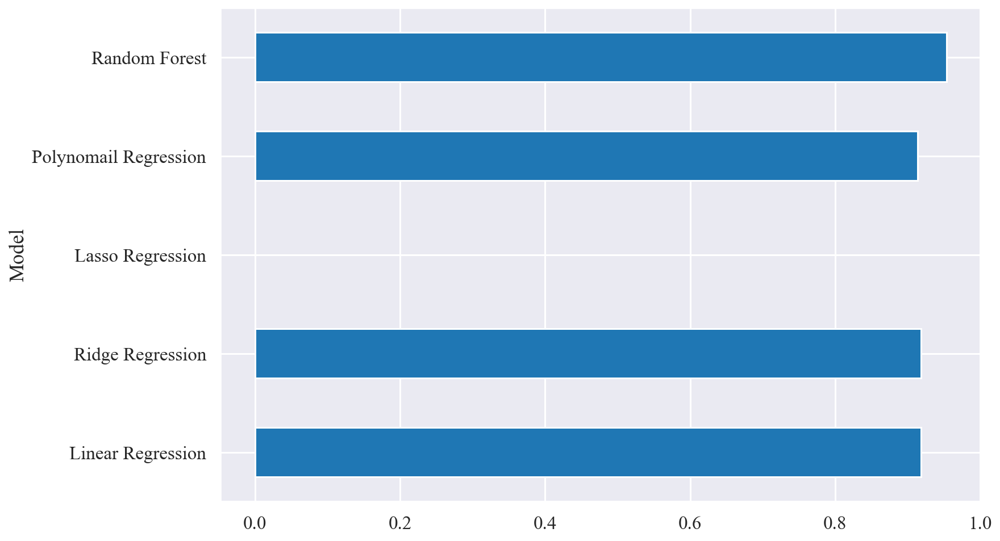

In [69]:
results_df.set_index('Model', inplace=True)
results_df['R2 Square'].plot(kind='barh', figsize=(12, 8))